# Introduction

This work will be focused on removing outlier data from ICP-MS data.

In [244]:
import pandas as pd
import math
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import kurtosis
import collections
import random
import os
import re

In [245]:
# This cell is tagged with 'parameters'
path_to_data = './data/Stds_052125.csv'
response_index = 0
report_title = "Example Report"
threshold_value = .9

In [246]:
# Import data
df = pd.read_csv(path_to_data)
t = df['Time']
t.max()

np.float64(7812.145)

In [247]:
from OutlierUtils import remove_outliers_by_region
from OutlierUtils import get_area
from OutlierUtils import get_motive_points

In [248]:
# set the response data
responses = df.drop(columns=['Replicate', 'Reading', 'Time'])        
response = responses.columns[response_index]
response_data = df[response]

In [249]:
# creat output folder
os.makedirs('./output', exist_ok=True)


#create dataset path
dataset_name = path_to_data.split('/')[-1].split('.')[0]
dataset_path = f'./output/{dataset_name}'
os.makedirs(dataset_path, exist_ok=True)

In [250]:
def sanitize_response_name(response):
    # Replace slashes with underscores
    clean = response.replace('/', '_')
    # Remove parentheses and commas
    clean = re.sub(r'[(),]', '', clean)
    # Replace spaces and dashes with underscores
    clean = re.sub(r'[\s\-]+', '_', clean)
    return clean.strip('_')  # remove leading/trailing underscores if any

In [251]:
safe_name = sanitize_response_name(response)
figure_dir = f'{dataset_path}/figures/{safe_name}'
os.makedirs(figure_dir, exist_ok=True)

Choose a minimum bin size: $$ \frac{\text{max } - \text{min}}{\sqrt{n}} $$

In [252]:
# First attempt at identifying shifts
X = collections.deque(t)
Y = collections.deque(response_data)

n = len(X)
min_merge_distance = (max(X)-min(X))/(math.sqrt(n))


We'll map out the intervals that were identified here. 

/var/folders/vm/_ljljg3d2ln_x5m_sd3t34kr0000gn/T/ipykernel_41893/2875142639.py:26: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


[(0.0, 65.666),
 (65.666, 128.74),
 (128.74, 187.494),
 (187.494, 258.345),
 (258.345, 328.764),
 (328.764, 393.566),
 (393.566, 518.851),
 (518.851, 607.414),
 (607.414, 665.736),
 (665.736, 724.058),
 (724.058, 782.381),
 (782.381, 840.703),
 (840.703, 899.457),
 (899.457, 958.211),
 (958.211, 1016.533),
 (1016.533, 1074.855),
 (1074.855, 1135.77),
 (1135.77, 1204.028),
 (1204.028, 1263.646),
 (1263.646, 1331.905),
 (1331.905, 1390.659),
 (1390.659, 1452.869),
 (1452.869, 1512.056),
 (1512.056, 1584.634),
 (1584.634, 1655.053),
 (1655.053, 1721.583),
 (1721.583, 1780.337),
 (1780.337, 1839.524),
 (1839.524, 1902.166),
 (1902.166, 1978.633),
 (1978.633, 2048.619),
 (2048.619, 2112.99),
 (2112.99, 2172.608),
 (2172.608, 2231.794),
 (2231.794, 2292.708),
 (2292.708, 2352.759),
 (2352.759, 2426.201),
 (2426.201, 2484.956),
 (2484.956, 2557.102),
 (2557.102, 2619.313),
 (2619.313, 2677.635),
 (2677.635, 2735.957),
 (2735.957, 2797.735),
 (2797.735, 2865.994),
 (2865.994, 2927.34),
 (2927.

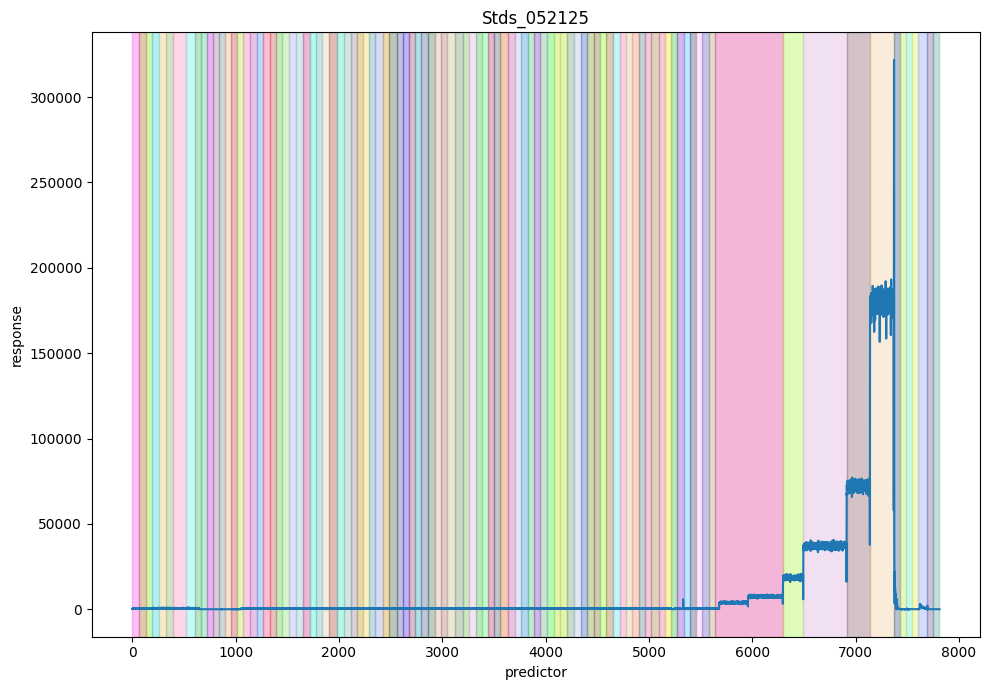

In [253]:
motive_points = get_motive_points(X=X.copy(), Y=Y.copy(), threshold_percentage=threshold_value, min_merge_distance=min_merge_distance)

fig,ax1 = plt.subplots(figsize=(10,7), layout='constrained')
ax1.plot(t, df[response])
curr_p = motive_points[0]
detected_intervals = []

for i in range(len(motive_points) - 1):
    start_p = motive_points[i]
    next_p = motive_points[i+1]
    detected_intervals.append((start_p, next_p))

# Iterate through the detected intervals and shade them
for i, (start_time, end_time) in enumerate(detected_intervals):
    # Generate a random color for each interval for better distinction
    random_color = (random.random(), random.random(), random.random())
    
    # Use axvspan to shade the region
    ax1.axvspan(start_time, end_time, color=random_color, alpha=0.3, 
                label=f'Interval {i+1}' if i == 0 else "") # Label only the first span for legend


plt.title(f'{dataset_name}')
ax1.set_xlabel('predictor')
ax1.set_ylabel('response')
fig.tight_layout()



plt.savefig(fname=f'{figure_dir}/intervals_{threshold_value}.png', dpi=300)
detected_intervals


Now, let's get the area for these intervals. 

$$ \int\limits_{R \in \left(t_0, t_1\right)} y(t)\,dt \approx 0 \text{,}$$

We can skip it in the outlier analysis as the large amplititude datapoints are seemingly cancelled out by the smaller fluctuations.


In [ ]:
interval_areas = {}

while(detected_intervals):
    x0,x1 = detected_intervals.pop() 

    interval_mask = (df['Time'] <= x1 ) & (df['Time'] >= x0)
    interval_df = df[interval_mask]

    t_int = interval_df['Time']
    data = interval_df[response]
    try:
        interval_areas[x0,x1] = get_area(R=t_int, data=data)
    except ValueError:
        if detected_intervals:
            continue
        else:
            break

area_df = pd.Series(interval_areas, name='Area')  # MultiIndex with (x0, x1)
area_df.index = pd.MultiIndex.from_tuples(area_df.index, names=['Start', 'End'])
area_df = area_df.reset_index()  # Optional: convert MultiIndex into columns


area_df.sort_index(axis=0, ascending=False, inplace=True)


We can plot the distribution to see a good value to drop at. For now, anything below 90 will not have its outliers dropped.

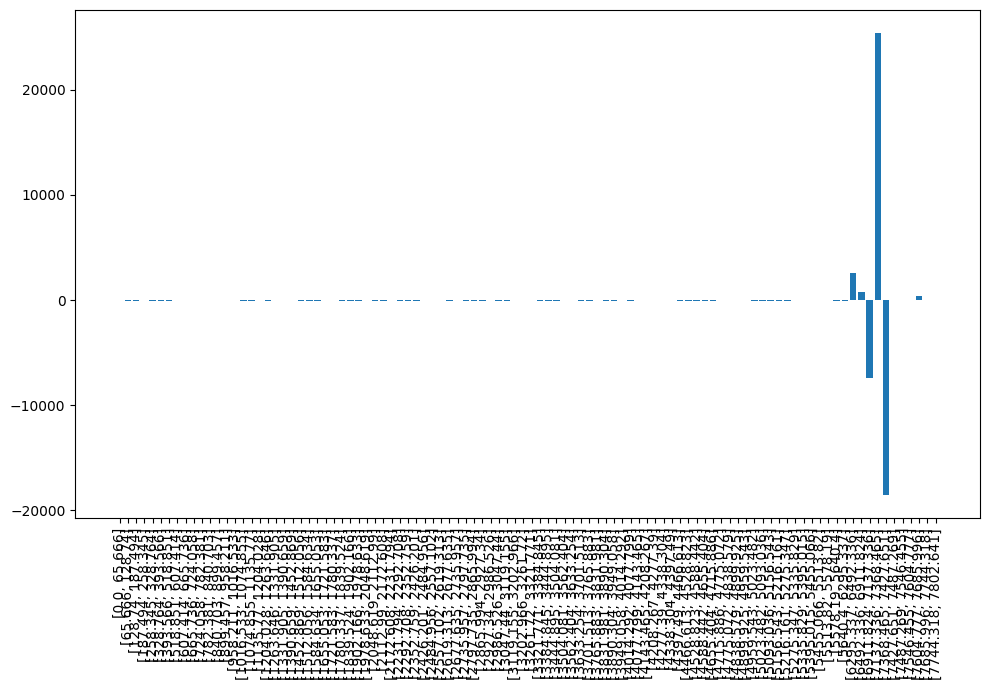

In [255]:

# Assuming area_df is already defined as a Series
area_df = area_df.reset_index()  # index now has 'Start' and 'End' columns
labels = [f"[{row['Start']}, {row['End']}]" for _, row in area_df.iterrows()]
fig, ax1 = plt.subplots(figsize=(10, 7))

# Plot the bars
ax1.bar(area_df.index.astype(str), area_df['Area'])  # Convert index to string for proper label display

# Improve tick display
ax1.set_xticks(range(len(area_df)))
ax1.set_xticklabels(labels,rotation=90)  # Rotate for better readability
plt.tight_layout()
plt.savefig(f'{figure_dir}/areas.png', dpi=300)
plt.show()


In [ ]:
# Want to keep only top p% of area
p = .75
quantile_to_keep = 1 - p
area_to_keep = area_df.quantile(quantile_to_keep, axis=0)
area_to_keep = area_to_keep['Area']

: 

In [257]:
# Look at those where area > 90 units
area_df = area_df[area_df['Area'] > area_to_keep]
area_df

,index,Start,End,Area
0,99,0.000,65.666,14.828973
1,98,65.666,128.740,-39.468882
2,97,128.740,187.494,-47.582433
3,96,187.494,258.345,-26.991843
5,94,328.764,393.566,-71.860905
...,...,...,...,...
95,4,7487.269,7546.455,-7.829854
96,3,7546.455,7604.777,-16.973876
97,2,7604.777,7685.996,370.085499
98,1,7685.996,7744.318,-15.119654


Let's now remove outliers by the given region. We can use the `remove_outliers_by_region` function defined in the `OutlierUtils` module. 

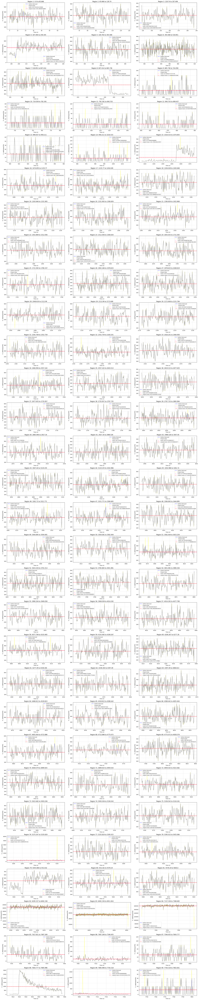

In [ ]:
regional_means = []

num_regions = len(area_df)
ncols = 3 # You can change the number of columns
nrows = (num_regions + ncols - 1) // ncols

offset = 15 # 15 seconds offset to 

final_df = pd.DataFrame()


fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(24, 4 * nrows))
axes_flat = axes.flatten() # Flatten the 2D axes array for easier iteration

for i, (key, val) in enumerate(area_df.iterrows()):
    # Get the current Axes object for this iteration from the flattened array
    if i < len(axes_flat):
        current_ax = axes_flat[i]
    else:
        # This case should ideally not happen if nrows is calculated correctly,
        # but provides a safeguard if more plots are attempted than subplots available.
        print(f"Warning: Not enough subplots for region {i+1}. Skipping plot.")
        continue

    # Call your outlier removal function for the current region
    Y_prime = remove_outliers_by_region(R=[val['Start'] + offset, val['End'] - offset],
                                        response_column_name=response, Y=df)
    
    # print(f'New Region {i+1}: ({val['Start'] + offset}, {val['End'] - offset})')

    # Plot the results on the current subplot
    if not Y_prime.empty:
        # Plot the data after outlier removal
        current_ax.plot(Y_prime['Time'], Y_prime[response], label='Outliers Removed', color='blue', alpha=0.8)
        
        # Plot original data for comparison (only within the current region)

        original_region_data = df[(df['Time'] >= val['Start']) & (df['Time'] <= val['End'])]
        
        
        current_ax.plot(original_region_data['Time'], original_region_data[response],
                        '--', color='yellow', alpha=0.7, label='Original Data')
        
        region_mean = Y_prime[response].mean()
        original_mean = original_region_data[response].mean()
        
        current_ax.axhline(y=region_mean, color='#FF69B4', linestyle='-.', label=f'mean={region_mean}')
        current_ax.axhline(y=original_mean, color='red', linestyle='--', label=f'original mean={original_mean}')

        regional_means.append(region_mean)
        
        current_ax.legend(fontsize='small')
    else:
        current_ax.text(0.5, 0.5, 'No Data or Outliers Removed\nfor this Region',
                        horizontalalignment='center', verticalalignment='center',
                        transform=current_ax.transAxes, fontsize=10, color='red')

    # Set titles and labels for the current subplot
    current_ax.set_title(f'Region {i+1}: {val["Start"]} to {val["End"]}')
    current_ax.set_xlabel('Time (s)')
    current_ax.set_ylabel(f'{response}')
    current_ax.grid(True, linestyle='--', alpha=0.6) # Add a grid for better readability

    final_df = pd.concat([final_df, Y_prime], ignore_index=True)



# This prevents empty plots from appearing if your `area_df` has fewer regions than the grid size
for j in range(num_regions, len(axes_flat)):
    fig.delaxes(axes_flat[j])

plt.savefig(f'{figure_dir}/regions.png',
             bbox_inches='tight',
             dpi=300)
plt.tight_layout() # Automatically adjust subplot parameters for a tight layout
plt.show() # Display the plot
    
# plt.tight_layout()
# plt.show()

In [259]:
final_df = final_df.sort_index()


/var/folders/vm/_ljljg3d2ln_x5m_sd3t34kr0000gn/T/ipykernel_41893/2119709032.py:7: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


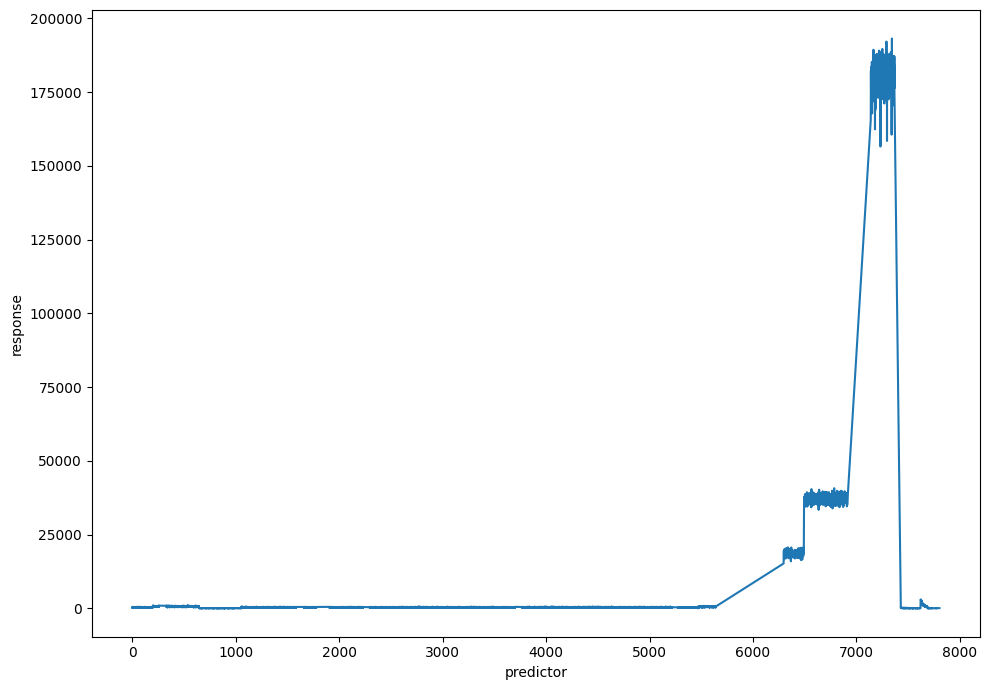

In [260]:
new_t = final_df['Time']
fig,ax1 = plt.subplots(figsize=(10,7), layout='constrained')
ax1.plot(new_t, final_df[response])

ax1.set_xlabel('predictor')
ax1.set_ylabel('response')
fig.tight_layout()

plt.savefig(fname=f'{figure_dir}/cleaned_graph.png', dpi=300)


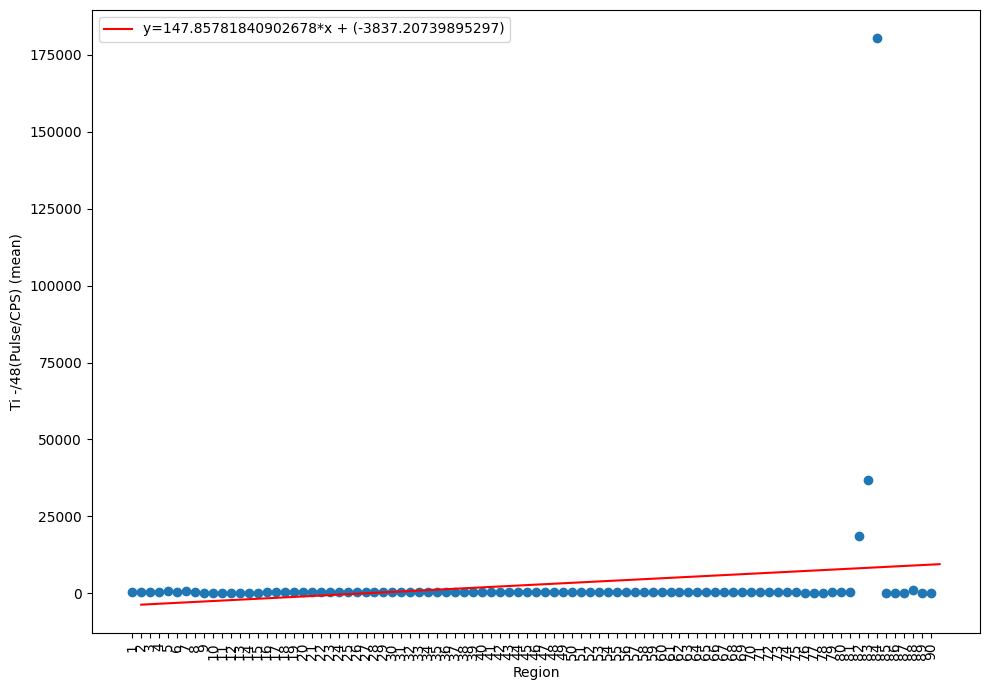

In [261]:
# Start plotting regional means
# Assuming area_df is already defined as a Series

labels = np.arange(1,len(regional_means)+1)
fig, ax1 = plt.subplots(figsize=(10, 7))

# Plot the bars
ax1.scatter(area_df.index.astype(str), regional_means)  # Convert index to string for proper label display

m,b = np.polyfit(labels, regional_means, 1)

ax1.plot(labels, m*labels+b, color='red', label=f'y={m}*x + ({b})')
plt.legend()


ax1.set_xlabel('Region')
ax1.set_ylabel(f'{response} (mean)')

# Improve tick display
ax1.set_xticks(range(len(area_df)))
ax1.set_xticklabels(labels,rotation=90)  # Rotate for better readability
plt.tight_layout()
plt.savefig(f'{figure_dir}/regression.png', bbox_inches='tight',dpi=300)
plt.show()



$$ \textit{Opus ex amino, } \\ \text{Bhagawat Chapagain} $$